In [1]:
%load_ext autoreload
%autoreload 2

from IPython.display import display, Image
import arviz
import fastprogress
import pymc as pm
import numpy
import pandas
from matplotlib import pyplot, cm
import ipywidgets
import pathlib
import pyrff

import dataloading
import models
import plotting

### Fetch data and calibrations

In [4]:
cmX360 = models.LogisticBiomassAbsorbanceModel.load("cm_biomass_A360.json")
cmX600 = models.LogisticBiomassAbsorbanceModel.load("cm_biomass_A600.json")
cmP360 = models.LinearProductAbsorbanceModel.load("cm_product_A360.json")

design_cols = ["iptg", "glucose"]
df_layout = dataloading.get_layout(r"FullWellDescription.xlsx", design_cols)
df_time, df_A360, df_A600 = dataloading.vectorize_observations(
    df_layout,
    observations={
        f"Carboxylase_{v}": (
            dataloading.read_absorbances(rf"Carboxylase_{v}_360nm.csv"),
            dataloading.read_absorbances(rf"Carboxylase_{v}_600nm.csv"),
        )
        for v in [19, 20, 21, 23]
    }
)
df_commons = dataloading.count_replicates(df_layout)

display(df_commons.head())

120 rows were dropped because a product concentration was unknown AND information in columns ['iptg', 'glucose'] was incomplete.


,,Carboxylase_19,Carboxylase_20,Carboxylase_21,Carboxylase_23,n_replicates,redundancy
design_id,group,,,,,,
7PRRD,1.2/2.0,0,0,4,4,8,✅ (2)
7CLLR,12.0/2.0,0,0,4,4,8,✅ (2)
LRHE9,6.0/2.0,0,0,4,4,8,✅ (2)
CT9D5,2.4/2.0,0,0,4,4,8,✅ (2)
81N4D,3.2/4.8,4,4,0,0,8,✅ (2)


### Construct the full model

c:\users\osthege\repos\pymc-main\pymc\gp\cov.py:95: UserWarning: Only 2 column(s) out of Subtensor{int64}.0 are being used to compute the covariance function. If this is not intended, increase 'input_dim' parameter to the number of columns to use. Ignore otherwise.
  warnings.warn(
WARNING (aesara.tensor.blas): We did not find a dynamic library in the library_dir of the library we use for blas. If you use ATLAS, make sure to compile it with dynamics library.
WARNING (aesara.tensor.blas): We did not find a dynamic library in the library_dir of the library we use for blas. If you use ATLAS, make sure to compile it with dynamics library.


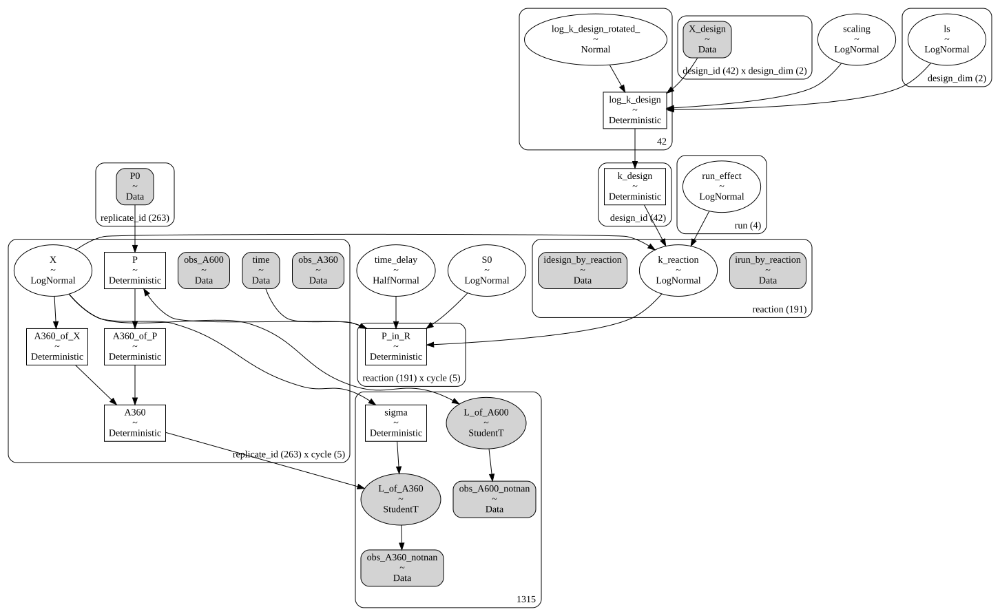

In [5]:
with pm.Model() as pmodel:
    pmodel = models.build_model(
        df_layout,    # for mapping reaction and assay wells
        df_time,
        df_A360,
        df_A600,
        cmX360,       # for learning about X from A360
        cmX600,       # for learning about X from A600
        cmP360,       # for learning about P from A360
        kind="GP mass action",
        design_cols=design_cols,
    )

# Optional: Plot the model in plate notation
display(pm.model_to_graphviz(pmodel))

### Hit the inference button!

In [6]:
fp = pathlib.Path("03.4_multibatch_GP.nc")
if fp.exists():
    idata = arviz.from_netcdf(fp)
else:
    with pmodel:
        idata = pm.sample()
    idata.to_netcdf(fp)
idata

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (3 chains in 3 jobs)
NUTS: [X, S0, time_delay, ls, scaling, log_k_design_rotated_, run_effect, k_reaction]


Sampling 3 chains for 1_000 tune and 1_000 draw iterations (3_000 + 3_000 draws total) took 1190 seconds.
There were 32 divergences after tuning. Increase `target_accept` or reparameterize.
The estimated number of effective samples is smaller than 200 for some parameters.


Inference data with groups:
	> posterior
	> log_likelihood
	> sample_stats
	> observed_data
	> constant_data

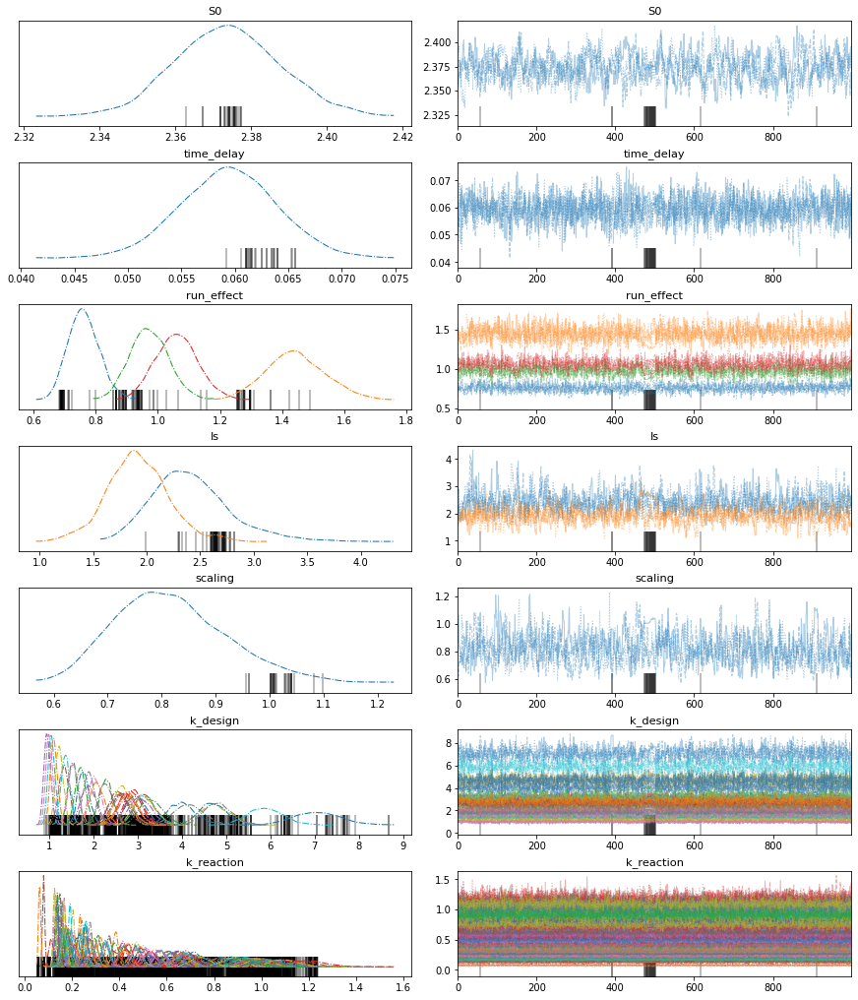

In [7]:
interesting_variables = [
    "S0",
    "time_delay",
    "run_effect",
    "ls",
    "scaling",
    "k_design",
    "k_reaction",
]
arviz.plot_trace(idata, var_names=interesting_variables, combined=True);

In [8]:
summary = plotting.summarize(idata, df_layout)
summary.to_excel("03.4_summary_gp.xlsx")
summary

,run,assay_well,reactor,group,product,biomass,iptg,glucose,design_id,p_best_design,p_best_reaction,k_design_mM/h/CDW_lower,k_design_mM/h/CDW,k_design_mM/h/CDW_upper,k_reaction_mM/h/CDW_lower,k_reaction_mM/h/CDW,k_reaction_mM/h/CDW_upper,initial_rate_mM/h_lower,initial_rate_mM/h,initial_rate_mM/h_upper
replicate_id,,,,,,,,,,,,,,,,,,,,
ZR7B9,Carboxylase_19,A01,A1,0.24/4.8,NaN,NaN,0.24,4.8,9MWZT,0.0,0.0,0.844773,0.953831,1.089162,0.145145,0.162859,0.182063,0.03085,0.03668,0.042885
A9WZY,Carboxylase_19,B01,B1,0.24/4.8,NaN,NaN,0.24,4.8,9MWZT,0.0,0.0,0.844773,0.953831,1.089162,0.170287,0.188541,0.21101,0.041503,0.048477,0.056225
LB36N,Carboxylase_19,C01,C1,0.24/4.8,NaN,NaN,0.24,4.8,9MWZT,0.0,0.0,0.844773,0.953831,1.089162,0.137101,0.155431,0.173737,0.02761,0.033465,0.039234
X9PP3,Carboxylase_19,D01,D1,0.24/4.8,NaN,NaN,0.24,4.8,9MWZT,0.0,0.0,0.844773,0.953831,1.089162,0.14375,0.164365,0.184749,0.030629,0.03741,0.044493
QT7E6,Carboxylase_19,E01,E1,0.32/4.8,NaN,NaN,0.32,4.8,K9QEL,0.0,0.0,0.885475,0.999238,1.132014,0.144814,0.172211,0.195446,0.030164,0.039593,0.047832
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
34F4H,Carboxylase_21,F04,F4,12.0/1.5,NaN,NaN,12.00,1.5,XWPQC,0.0,0.0,5.199168,5.877648,6.502305,0.574747,0.623706,0.675577,0.061257,0.068704,0.076655
1YZ65,Carboxylase_21,E02,E2,12.0/1.0,NaN,NaN,12.00,1.0,16ZMH,1.0,0.0,6.163208,7.052127,7.89455,0.641278,0.68336,0.726227,0.061789,0.068069,0.074295
CPL7E,Carboxylase_21,F02,F2,12.0/1.0,NaN,NaN,12.00,1.0,16ZMH,1.0,0.0,6.163208,7.052127,7.89455,0.59428,0.639396,0.683589,0.054937,0.061293,0.067885


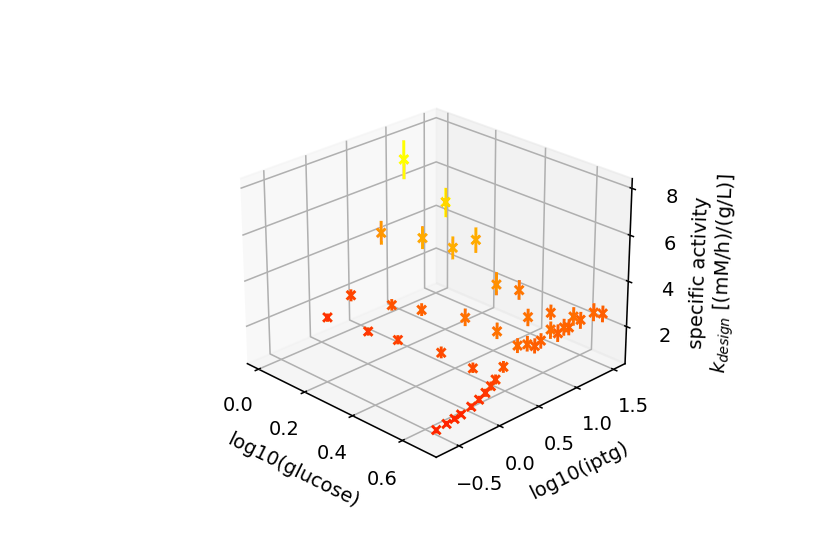

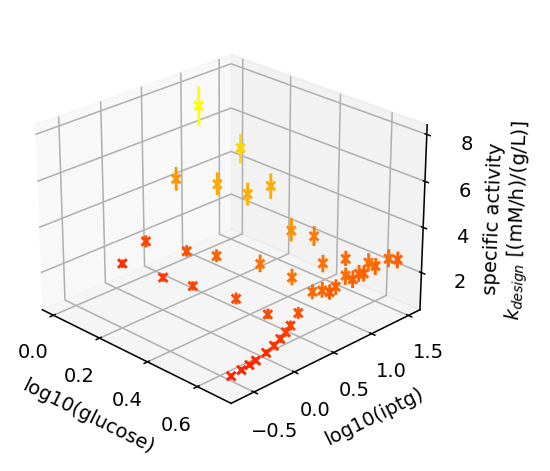

In [9]:
def fn_plot3d(t):
    plotting.plot_3d_k_design(idata, azim=-45+30*numpy.sin(t*2*numpy.pi))
    
fn_plot3d(0)

fp_out = plotting.plot_gif(
    fn_plot=fn_plot3d,
    fp_out="03.4_multibatch3d.gif",
    data=numpy.arange(0, 1, 1/60),
    fps=15,
    delay_frames=0
)
Image(fp_out)

In [10]:
def fn_plot(rid):
    plotting.plot_reaction(idata, rid, cm_600=cmX600, reaction_order=summary.index)
    return

ipywidgets.interact(
    fn_plot,
    rid=summary.index,
);

interactive(children=(Dropdown(description='rid', options=('ZR7B9', 'A9WZY', 'LB36N', 'X9PP3', 'QT7E6', 'PE83K…

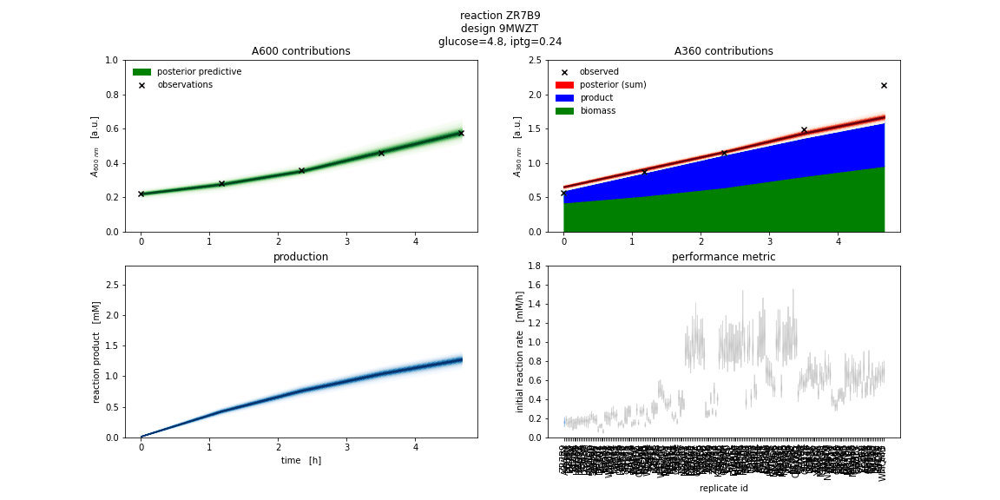

In [11]:
fp_out = plotting.plot_gif(
    fn_plot=fn_plot,
    fp_out="03.4_multibatch_GP.gif",
    data=summary.index,
    fps=3
)
Image(fp_out)

# WIP: Plotting interpolations

In [12]:
# # add observations, conditioned on slices of x-coordinates to the model
# with pmodel:
#     for dname, x_dense in X_denses.items():
#         pmodel.gp.conditional(dname, Xnew=x_dense)

# with gpmodel:
#     pp_map = pymc3.sample_posterior_predictive(
#         [map_]*1000,
#         var_names=list(X_denses.keys()),
#         random_seed=None
#     )
#     pp_mcmc = pymc3.sample_posterior_predictive(
#         idata.posterior,
#         samples=1000,
#         var_names=list(X_denses.keys()),
#         random_seed=None
#     )

# M = 200
# N_rffs = 1000
# C = idata.posterior.dims['chain']
# S = idata.posterior.dims['draw']
# posterior_indices = numpy.random.randint(low=0, high=C * S, size=N_rffs)
# rffs_mcmc = []
# for i in fastprogress.progress_bar(posterior_indices):
#     try:
#         rff = pyrff.sample_rff(
#             lengthscales=idata.posterior['ls'].values.reshape(C * S, D)[i],
#             scaling=idata.posterior['scaling'].values.reshape(C * S,)[i],
#             noise=idata.posterior['sigma'].values.reshape(C * S,)[i],
#             # because the model uses the ExpQuad kernel:
#             kernel_nu=numpy.inf,
#             X=X,
#             Y=Y,
#             M=M,
#         )
#         rffs_mcmc.append(rff)
#     except numpy.linalg.LinAlgError:
#         pass

# label, pp, rffs = ('MCMC', pp_mcmc, rffs_mcmc)

# fig, axs = pyplot.subplots(nrows=D, ncols=2, figsize=(12, 5*D), squeeze=False, sharey='row')

# for d, (left, right) in enumerate(axs):
#     dname = f'D{d}'
#     x_dense = X_denses[dname]

#     # plot functions
#     for fname, f in [
#             ('GP mean function', lambda x: gp.mean_func(x).eval())
#         ]:
#         left.plot(x_dense[:,d], f(x_dense), label=fname)
#         right.plot(x_dense[:,d], f(x_dense), label=fname)

#     # plot conditionals and approximations
#     pymc3.gp.util.plot_gp_dist(left, pp[dname][:, 0, :], x_dense[:,d])
#     pymc3.gp.util.plot_gp_dist(right, numpy.array([
#         f_rff(x_dense)
#         for f_rff in rffs
#     ]), x_dense[:,d])

#     if D == 1:
#         left.scatter(X[:,d], Y, label='$Y_{obs}$')
#         right.scatter(X[:,d], Y, label='$Y_{obs}$')
#     left.set_ylabel('$f({dname})$')

# axs[0,0].set_title('conditionals')
# axs[0,1].set_title('RFF approximations')
# fig.suptitle(f'from {label} fit', y=1.02)
# fig.tight_layout()
# pyplot.show()

# n_rff = 50
# # create X-coordinates for 2D plotting
# n = 100
# x_dense = numpy.array(numpy.meshgrid(*[
#     numpy.linspace(lb, ub, n)
#     for lb, ub in BOUNDS
# ])).T.reshape(n*n, D)


# # make the plot for both MAP and MCMC results
# for label, _, rffs in [
#     ('MCMC', pp_mcmc, rffs_mcmc),
# ]:
#     #x_star_x, x_star_y = x_star[label]

#     fig = pyplot.figure(dpi=160, figsize=(10, 5))
#     ax3d = fig.add_subplot(1, 2, 1, projection='3d')
#     ax2d = fig.add_subplot(1, 2, 2)

#     # plot observations
#     ax3d.scatter(
#         X[:,0], X[:,1], Y,
#         color=cm.autumn(Y),
#         marker='x', label='$Y_{obs}$',
#         alpha=1
#     )

#     # plot some RFFs        
#     for rff in rffs[:n_rff]:
#         z = rff(x_dense)
#         ax3d.plot_surface(
#             x_dense[:,0].reshape(n,n), x_dense[:,1].reshape(n,n), z.reshape(n,n),
#             #marker='.', s=0.2,
#             alpha=1/n_rff, color='blue'
#         )

#     ax3d.set_xlabel('log(IPTG [mM])')
#     ax3d.set_ylabel('log(glucose [g/L])')
#     ax3d.set_zlabel('$k_{reaction}$ [mM/h]')
#     ax3d.view_init(elev=25, azim=-65)

#     # plot heatmap and optima to the right
# #     ax2d.imshow(
# #         truth(x_dense).reshape(n,n),
# #         extent=BOUNDS.flatten(),
# #         cmap=cm.autumn
# #     )
#     ax2d.scatter(
#         X[:, 0],
#         X[:, 1],
#         marker='x', color='black', s=12,
#         label='observations'
#     )
# #     ax2d.scatter(
# #         x_star_x[:, 0],
# #         x_star_x[:, 1],
# #         marker='.', color='black', s=0.5,
# #         label='$p(x_*|X,Y)$'
# #     )

#     ax2d.set_title(f'samples from {label} fit')
#     ax2d.set_xlabel('D0')
#     ax2d.set_ylabel('D1')
#     ax2d.set_xlim(*BOUNDS[0]*3)
#     ax2d.set_ylim(*BOUNDS[1]*3)
#     ax2d.legend(loc='upper right')

#     pyplot.show()

In [13]:
%load_ext watermark
%watermark -n -u -v -iv -w

Last updated: Mon Nov 08 2021

Python implementation: CPython
Python version       : 3.8.10
IPython version      : 7.22.0

matplotlib  : 3.4.2
fastprogress: 1.0.0
pyrff       : 2.0.1
pandas      : 1.3.0
numpy       : 1.21.0
ipywidgets  : 7.6.3
arviz       : 0.11.2
pymc        : 4.0.0

Watermark: 2.2.0

